In [1]:
import cv2, glob
import pandas as pd
import matplotlib.pyplot as plt
from os import path as path_lib

In [2]:
!ls ../Data/TRAIN/ | head -5

004 Osmia lignaria f right 4x.csv
004 Osmia lignaria f right 4x.jpg
013 Osmia texana m right 4x.csv
013 Osmia texana m right 4x.jpg
105 Lasioglossum pilosum f left 4x.jpg


In [3]:
# Path containing training data
path = '../Data/TRAIN/'

In [4]:
def click_event(event, x, y, flags, params):
    if event == cv2.EVENT_LBUTTONDOWN:
        print('Add point at ({}, {})'.format(x, y))
        
        # Swap x and y and insert into df
        df.loc[df.shape[0]] = [y, x]

        font = cv2.FONT_HERSHEY_SIMPLEX
        color = (255, 255, 0)
        cv2.putText(img, str(x) + ',' +
                    str(y), (x,y), font,
                    1, color, 2)
    cv2.imshow('image', img)

In [5]:
# Init window
window_name = 'image'
cv2.namedWindow(window_name, cv2.WINDOW_NORMAL)
cv2.setMouseCallback(window_name, click_event)

## Create csv file if missing

for file in glob.glob(path + '*.jpg'):
    # check if there is already a CSV
    csv_path = file[:-4] + '.csv'
    if path_lib.exists(csv_path):
        continue

    df = pd.DataFrame(columns=['x', 'y'])
    
    # Display image 
    img = cv2.imread(file)
    cv2.imshow(window_name, img)

    # Wait for key pressed
    key = cv2.waitKey(0)
    
    # Save csv file
    csv_file = file[:-4] + '.csv'
    df.to_csv(csv_file, index=False, header=False)
    print('Saved file: {}'.format(csv_file))
    
    # Check quit key
    if key == ord('q'):
        break

cv2.destroyAllWindows()  

Add point at (669, 613)
Add point at (549, 724)
Add point at (191, 916)
Add point at (143, 935)
Add point at (106, 1084)
Add point at (833, 1193)
Add point at (793, 1003)
Add point at (1088, 857)
Add point at (1051, 824)
Add point at (1153, 667)
Add point at (992, 565)
Add point at (1419, 671)
Add point at (1494, 946)
Add point at (1299, 1143)
Add point at (839, 521)
Add point at (1541, 935)
Add point at (1046, 510)
Add point at (1943, 582)
Add point at (769, 1267)
Saved file: ../Data/TRAIN/193 Megachile latimanus f right 4x.csv
Add point at (375, 666)
Add point at (451, 610)
Add point at (356, 786)
Add point at (45, 1101)
Add point at (17, 1125)
Add point at (99, 1318)
Add point at (766, 1362)
Add point at (801, 1266)
Add point at (723, 1099)
Add point at (814, 762)
Add point at (827, 610)
Add point at (714, 573)
Add point at (864, 417)
Add point at (1020, 590)
Add point at (1179, 547)
Add point at (1624, 338)
Add point at (1387, 803)
Add point at (1278, 836)
Add point at (1046, 801)


In [6]:
def plot_img(img, gt=None, title='', scatter=30):
    plt.title(title)
    plt.imshow(img, cmap='gray')
    
    if gt is not None:
        xs = list(gt[0])
        ys = list(gt[1])
        for idx in range(len(xs)):
            j, i = ys[idx], xs[idx]
            plt.scatter(j, i, color='r', s=scatter)

In [7]:
def read_csv_or_none(csv_path):
    try:
        return pd.read_csv(csv_path, header=None)
    except:
        return None

In [8]:
img_list = []
csv_list = []
title_list = []

for file in glob.glob(path + '*.jpg'):
    # Read image
    img_list.append(cv2.imread(file))
    csv_list.append(read_csv_or_none(file[:-3] + 'csv'))
    title_list.append(file[:-4])

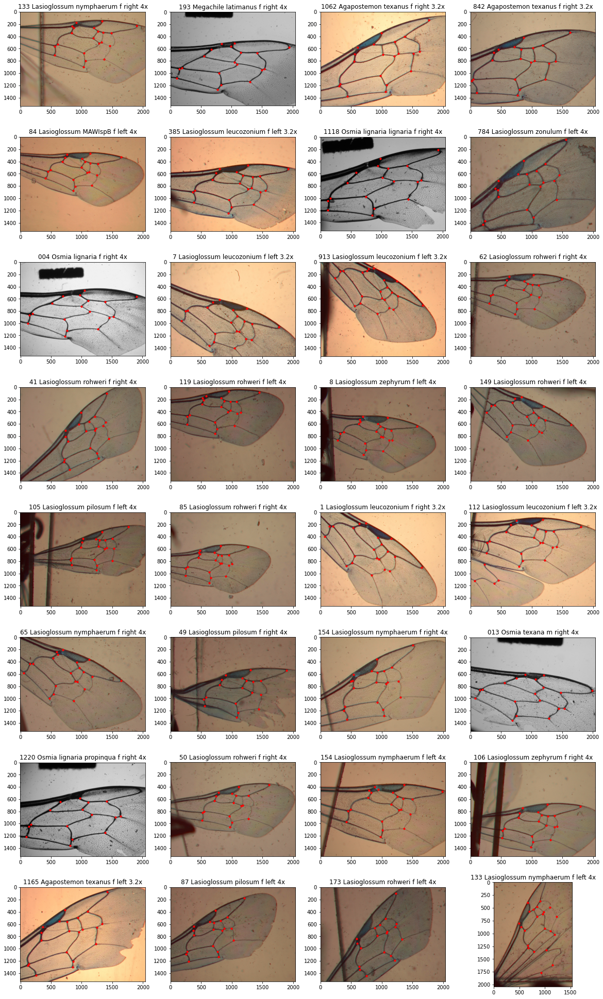

In [9]:
# Display 4 images per line

plt.figure(figsize=(20, 35))
for i in range(32):
    title = title_list[i].split('/')[-1]
    
    plt.subplot(8, 4, i + 1)
    plot_img(img_list[i], csv_list[i], title, scatter=10)
    
plt.show()

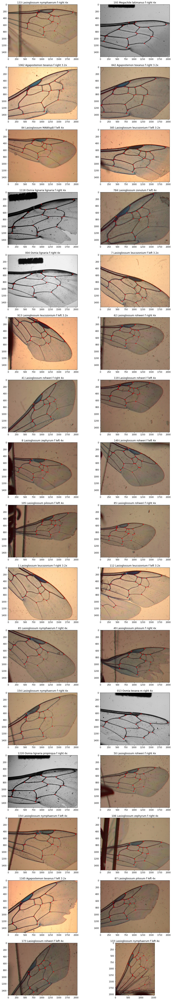

In [10]:
# Display 2 images per line

plt.figure(figsize=(15, 90))
for i in range(32):
    title = title_list[i].split('/')[-1]
    
    plt.subplot(16, 2, i + 1)
    plot_img(img_list[i], csv_list[i], title, scatter=10)

plt.show()